In [1]:
#Importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

#Importing IsolationForest module
from sklearn.ensemble import IsolationForest

#Importing Line2D for marking legend in graph
from matplotlib.lines import Line2D

#Just to filter out warnings- Well I hate warnings popping on the screen 
import warnings
warnings.filterwarnings("ignore")

#We set the seed for random, so we generate same results whenever we run
np.random.seed(0)

In [30]:
#Now we will generate datasets 

#Generating a normally distributed data set for training
X = 0.3 * np.random.randn(100, 2)
X_train_normal = np.r_[X + 2, X - 2]

#Generating outliers for training
X_train_outliers = np.random.uniform(low=-4, high=4, size=(20, 2))

#Generating a normally distributed dataset for testing
X = 0.3 * np.random.randn(20, 2)
X_test_normal = np.r_[X + 2, X - 2]

#Generating outliers for testing
X_test_outliers = np.random.uniform(low=-4, high=4, size=(10, 2))

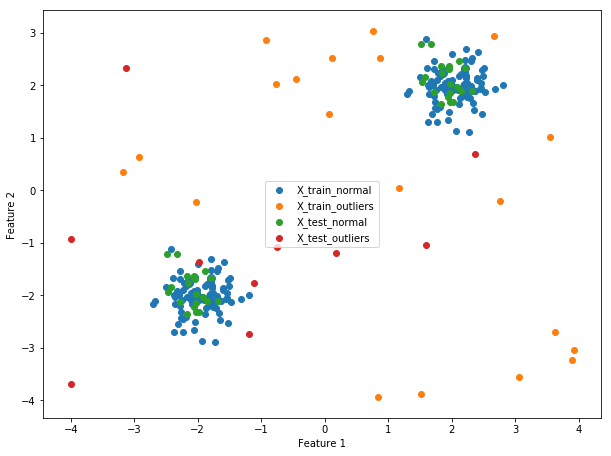

In [31]:
#Plotting and visualising the data points
plt.figure(figsize=(10,7.5))
plt.scatter(X_train_normal[:,0],X_train_normal[:,1],label='X_train_normal')
plt.scatter(X_train_outliers[:,0],X_train_outliers[:,1],label='X_train_outliers')
plt.scatter(X_test_normal[:,0],X_test_normal[:,1],label='X_test_normal')
plt.scatter(X_test_outliers[:,0],X_test_outliers[:,1],label='X_test_outliers')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

In [32]:
#Now we will append the normal points and outliers- train and test separately
X_train=np.append(X_train_normal,X_train_outliers,axis=0)
X_test=np.append(X_test_normal,X_test_outliers,axis=0)

#Training with isolation forest algorithm
clf = IsolationForest(random_state=0, contamination=0.1)
clf.fit(X_train)

#Now we predict the anomaly state for data
y_train=clf.predict(X_train)
y_test=clf.predict(X_test)  

In [33]:
X_train.shape,X_test.shape

((220, 2), (50, 2))

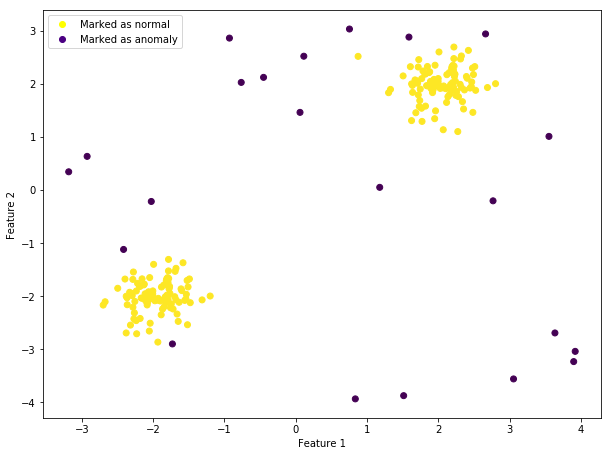

In [34]:
#Now we will plot and visualize how good our algorithm works for training data
#y_train(the state) will mark the colors accordingly
plt.figure(figsize=(10,7.5))
plt.scatter(X_train[:,0],X_train[:,1],c=y_train)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

 
#This is to set the legend appropriately
legend_elements = [Line2D([], [], marker='o', color='yellow', label='Marked as normal',linestyle='None'),
                   Line2D([], [], marker='o', color='indigo', label='Marked as anomaly', linestyle='None')]
plt.legend(handles=legend_elements)

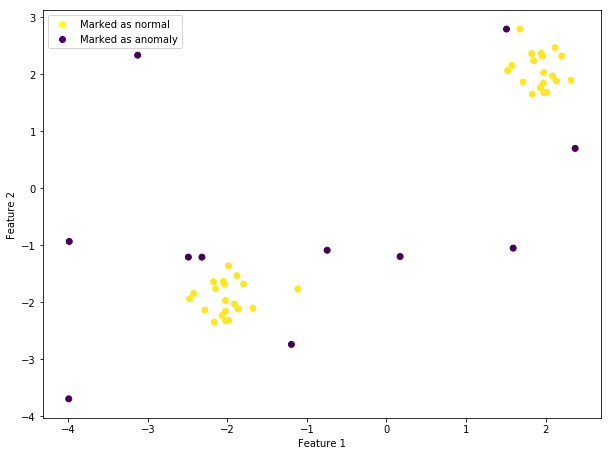

In [35]:
#Now we will do the same for the test data
plt.figure(figsize=(10,7.5))
plt.scatter(X_test[:,0],X_test[:,1],c=y_test)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

 

legend_elements = [Line2D([], [], marker='o', color='yellow', label='Marked as normal',linestyle='None'),
                   Line2D([], [], marker='o', color='indigo', label='Marked as anomaly', linestyle='None')]
plt.legend(handles=legend_elements)

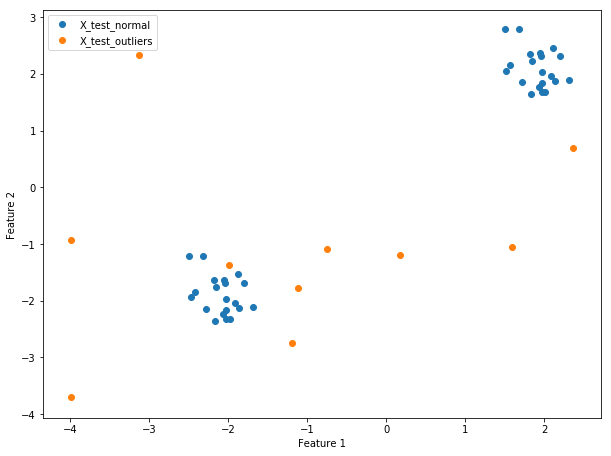

In [36]:
plt.figure(figsize=(10,7.5))
plt.scatter(X_test_normal[:,0],X_test_normal[:,1],label='X_test_normal')
plt.scatter(X_test_outliers[:,0],X_test_outliers[:,1],label='X_test_outliers')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

In [9]:
pwd

'C:\\Users\\Anil\\OneDrive\\Desktop\\insu'

## data source:

https://www.kaggle.com/roshansharma/insurance-claim

In [134]:
test = pd.read_excel('data_fraud.xlsx',header=None)

In [30]:
test.head(39).T

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
test,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y


In [34]:
test.iloc[:39].T

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
test,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y


In [82]:
test.iloc[39:78].T

,39,40,41,42,43,44,45,46,47,48,...,68,69,70,71,72,73,74,75,76,77
test,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y


In [145]:
test.iloc[78:117,].T

,78,79,80,81,82,83,84,85,86,87,...,107,108,109,110,111,112,113,114,115,116
0,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N


In [56]:
test.iloc[975:]

,test
975,8
976,35
977,699044
978,2013-12-05 00:00:00
979,OH
...,...
38995,3680
38996,Mercedes
38997,E400
38998,2007


In [136]:
cols = ['months_as_customer',
                'age',
                'policy_number',
                'policy_bind_date',
                'policy_state',
                'policy_csl',
                'policy_deductable',
                'policy_annual_premium',
                'umbrella_limit',
                'insured_zip',
                'insured_sex',
                'insured_education_level',
                'insured_occupation',
                'insured_hobbies',
                'insured_relationship',
                'capital-gains',
                'capital-loss',
                'incident_date',
                'incident_type',
                'collision_type',
                'incident_severity',
                'authorities_contacted',
                'incident_state',
                'incident_city',
                'incident_location',
                'incident_hour_of_the_day',
                'number_of_vehicles_involved',
                'property_damage',
                'bodily_injuries',
                'witnesses',
                'police_report_available',
                'total_claim_amount',
                'injury_claim',
                'property_claim',
                'vehicle_claim',
                'auto_make',
                'auto_model',
                'auto_year',
                'fraud_reported'
]

In [146]:
data = pd.DataFrame(columns=columns)
data

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported


In [147]:
j  = [i for i in range (0,len(test),39)]
for k,i in zip(j,range (39,len(test)+40,39)):
    a = pd.DataFrame(test.iloc[k:i].T)
    a.columns = cols
    data = data.append(a)
        
        
        

In [148]:
data.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
0,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
0,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
0,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
0,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [149]:
data.to_csv('motor_insurance_fraud.csv',index=False)

In [37]:
data = pd.read_csv('motor_insurance_fraud.csv')

In [38]:
pd.set_option('display.max_columns',None)

In [39]:
data.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,2015-01-10,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,2015-02-17,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


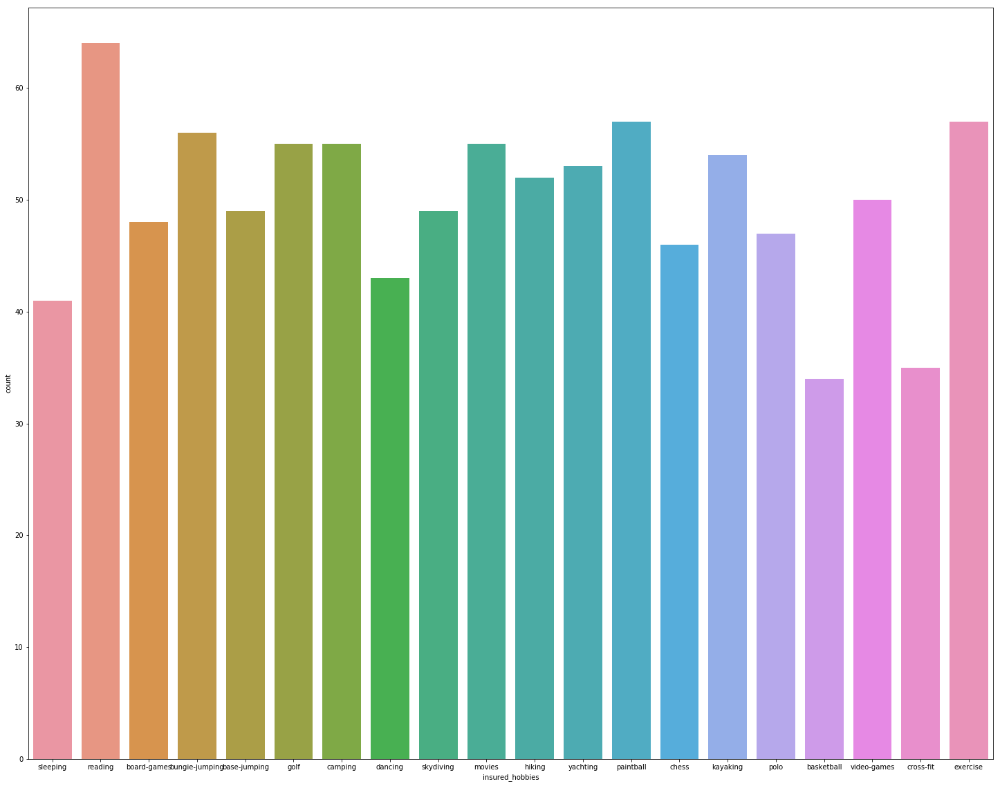

In [42]:
import seaborn as sns
plt.figure(figsize=(25,20))
sns.countplot(data.insured_hobbies)

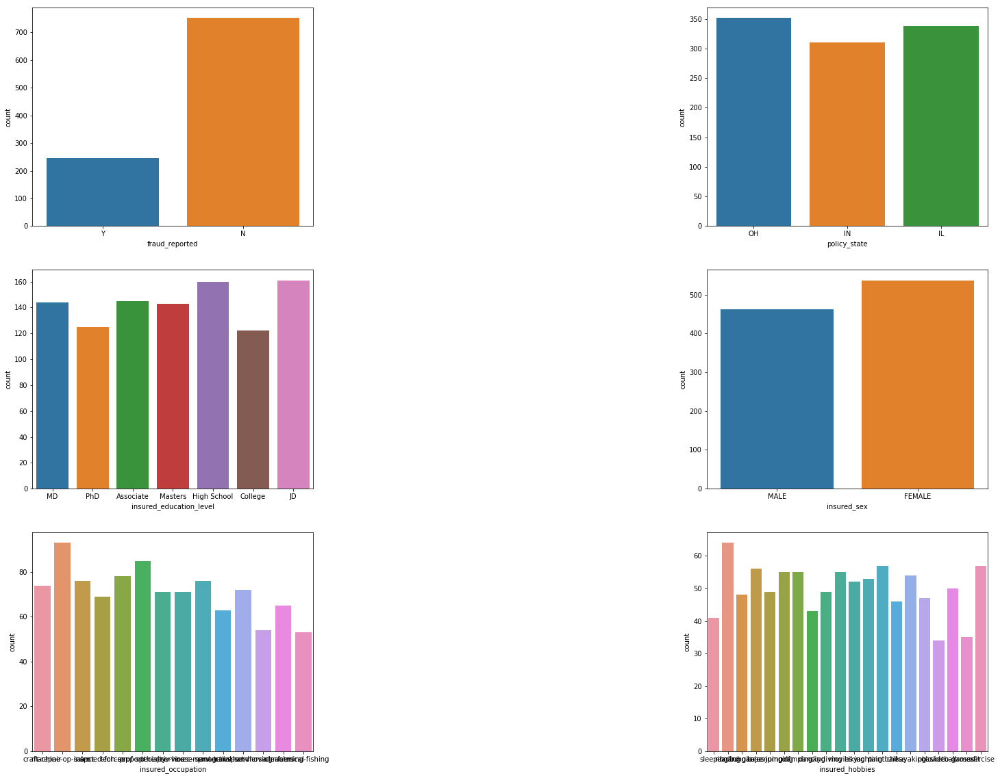

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(25,20))
plt.subplot(3,3,1)
sns.countplot(data.fraud_reported)
plt.subplot(3,3,3)
sns.countplot(data.policy_state)
plt.subplot(3,3,4)
sns.countplot(data.insured_education_level)
plt.subplot(3,3,6)
sns.countplot(data.insured_sex)
plt.subplot(3,3,7)
sns.countplot(data.insured_occupation)
plt.subplot(3,3,9)
sns.countplot(data.insured_hobbies)
plt.show()

In [44]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [45]:
numCols = data.select_dtypes('number').columns

In [46]:
numCols = list(numCols)

In [47]:
numCols

['months_as_customer',
 'age',
 'policy_number',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year']

In [48]:
catCols = [col for col in data.columns if data[col].dtype=="O"]

In [49]:
catCols

['policy_bind_date',
 'policy_state',
 'policy_csl',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [50]:
for i in catCols:
    print(data[i].value_counts())

1992-04-28    3
1992-08-05    3
2006-01-01    3
1991-12-28    2
2000-06-04    2
             ..
1992-11-27    1
2013-09-03    1
2010-06-28    1
1998-03-16    1
1991-04-25    1
Name: policy_bind_date, Length: 951, dtype: int64
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64
machine-op-inspct    93
prof-specialty       85
tech-support         78
exec-managerial      76
sales                76
craft-repair         74
transport-moving     72
priv-house-serv      71
other-service        71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64
reading           64

In [51]:
numCols

['months_as_customer',
 'age',
 'policy_number',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year']

In [52]:
## Excluded policy_number,insured_zip,incident_hour_of_the_day,auto_year
data_model = data[['months_as_customer','age','policy_deductable','policy_annual_premium','umbrella_limit','capital-gains',
 'capital-loss','number_of_vehicles_involved','bodily_injuries','witnesses','total_claim_amount','injury_claim','property_claim',
 'vehicle_claim']]

In [53]:
len(set(data.insured_zip)),len(data.insured_zip)

(995, 1000)

In [54]:
len(set(data.auto_year)),len(data.auto_year)

(21, 1000)

In [56]:
def time_of_day(x):
    y = 'tod_not_available'
    if x >0 and x<4:
        y = 'Mid_Night'
    elif x >=4 and x <= 8:
        y = 'Early_Morning'
    elif x > 8 and x <=12:
        y = 'Morning'
    elif x > 12 and x <= 16:
        y = 'Noon'
    elif x > 16 and x < 21:
        y = 'Evening'
    else:
        y = 'Night'
    return y

In [66]:
data_model['time_of_day'] = data['incident_hour_of_the_day'].apply(lambda x: time_of_day(x))

In [74]:
data['time_of_day'] = data_model['time_of_day']

In [67]:
data['auto_year'] = data['auto_year'].astype('string')

In [68]:
data_model['auto_year'] = data['auto_year'].astype('string')

In [69]:
test = data_model.copy()

In [70]:
test.head()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,time_of_day,auto_year
0,328,48,1000,1406.91,0,53300,0,1,1,2,71610,6510,13020,52080,Early_Morning,2004
1,228,42,2000,1197.22,5000000,0,0,1,0,0,5070,780,780,3510,Early_Morning,2007
2,134,29,2000,1413.14,5000000,35100,0,3,2,3,34650,7700,3850,23100,Early_Morning,2007
3,256,41,2000,1415.74,6000000,48900,-62400,1,1,2,63400,6340,6340,50720,Early_Morning,2014
4,228,44,1000,1583.91,6000000,66000,-46000,1,0,1,6500,1300,650,4550,Evening,2009


In [71]:
[x for x in data_model.time_of_day.value_counts().sort_values(ascending=False).index]

['Early_Morning', 'Night', 'Noon', 'Evening', 'Morning', 'Mid_Night']

In [72]:
def top_x(df2,variable):
    top_10 = [x for x in data[variable].value_counts().sort_values(ascending=False).index]
    for label in top_10:
        df2[variable+'_'+label] = np.where(data[variable]==label,1,0)

In [75]:
top_x(test,'auto_year')
top_x(test,'time_of_day')

In [76]:
catCols

['policy_bind_date',
 'policy_state',
 'policy_csl',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [77]:
top_x(test,'policy_state')

In [78]:
len(set(data.policy_state)),len(data.policy_state)

(3, 1000)

In [79]:
data[['policy_csl_person','policy_csl_accident']] = data['policy_csl'].str.split('/',expand=True)

In [80]:
data.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,time_of_day,policy_csl_person,policy_csl_accident
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,Early_Morning,250,500
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,Early_Morning,250,500
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,Early_Morning,100,300
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,2015-01-10,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,Early_Morning,250,500
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,2015-02-17,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,Evening,500,1000


In [81]:
data.auto_model.value_counts()

RAM               43
Wrangler          42
Neon              37
A3                37
MDX               36
Jetta             35
Passat            33
Legacy            32
A5                32
Pathfinder        31
Malibu            30
Camry             28
92x               28
Forrestor         28
95                27
F150              27
E400              27
Grand Cherokee    25
93                25
Maxima            24
Escape            24
Tahoe             24
X5                23
Ultima            23
Silverado         22
Civic             22
Highlander        22
Fusion            21
CRV               20
Corolla           20
Impreza           20
TL                20
ML350             20
3 Series          18
C300              18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64

In [305]:
data.police_report_available = np.where(data.police_report_available == '?','No_info_police_report',data.police_report_available)

In [310]:
data.isna().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [311]:
catCols

['policy_bind_date',
 'policy_state',
 'policy_csl',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [97]:
data.collision_type = np.where(data.collision_type == '?','No_info_colsn_type',data.collision_type)
data.property_damage = np.where(data.property_damage == '?','No_info_prprty_dmg',data.property_damage)
data.police_report_available = np.where(data.police_report_available == '?','No_info_police_report',data.police_report_available)

In [96]:
data.auto_model.value_counts()

RAM               43
Wrangler          42
Neon              37
A3                37
MDX               36
Jetta             35
Passat            33
Legacy            32
A5                32
Pathfinder        31
Malibu            30
Camry             28
92x               28
Forrestor         28
95                27
F150              27
E400              27
Grand Cherokee    25
93                25
Maxima            24
Escape            24
Tahoe             24
X5                23
Ultima            23
Silverado         22
Civic             22
Highlander        22
Fusion            21
CRV               20
Corolla           20
Impreza           20
TL                20
ML350             20
3 Series          18
C300              18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64

In [98]:
top_x(test,'policy_csl_person')
top_x(test,'policy_csl_accident')
top_x(test,'insured_sex')
top_x(test,'insured_hobbies')
top_x(test,'insured_relationship')
top_x(test,'incident_type')
top_x(test,'collision_type')
top_x(test,'incident_severity')
top_x(test,'authorities_contacted')
top_x(test,'incident_state')
top_x(test,'incident_city')
top_x(test,'property_damage')
top_x(test,'police_report_available')
top_x(test,'auto_make')
top_x(test,'auto_model')

In [99]:
len(set(data.insured_hobbies)),len(data.insured_hobbies)

(20, 1000)

In [100]:
test['fraud_reported'] = np.where(data.fraud_reported == 'Y',1,0)

In [101]:
test.drop(['time_of_day','auto_year'],inplace=True,axis=1)

In [102]:
test.head()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year_1995,auto_year_1999,auto_year_2005,auto_year_2011,auto_year_2006,auto_year_2007,auto_year_2003,auto_year_2009,auto_year_2010,auto_year_2013,auto_year_2002,auto_year_2015,auto_year_1997,auto_year_2012,auto_year_2008,auto_year_2014,auto_year_2000,auto_year_2001,auto_year_1998,auto_year_2004,auto_year_1996,time_of_day_Early_Morning,time_of_day_Night,time_of_day_Noon,time_of_day_Evening,time_of_day_Morning,time_of_day_Mid_Night,policy_state_OH,policy_state_IL,policy_state_IN,policy_csl_person_250,policy_csl_person_100,policy_csl_person_500,policy_csl_accident_500,policy_csl_accident_300,policy_csl_accident_1000,insured_sex_FEMALE,insured_sex_MALE,insured_hobbies_reading,insured_hobbies_exercise,insured_hobbies_paintball,insured_hobbies_bungie-jumping,insured_hobbies_golf,insured_hobbies_movies,insured_hobbies_camping,insured_hobbies_kayaking,insured_hobbies_yachting,insured_hobbies_hiking,insured_hobbies_video-games,insured_hobbies_base-jumping,insured_hobbies_skydiving,insured_hobbies_board-games,insured_hobbies_polo,insured_hobbies_chess,insured_hobbies_dancing,insured_hobbies_sleeping,insured_hobbies_cross-fit,insured_hobbies_basketball,insured_relationship_own-child,insured_relationship_other-relative,insured_relationship_not-in-family,insured_relationship_husband,insured_relationship_wife,insured_relationship_unmarried,incident_type_Multi-vehicle Collision,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,incident_type_Parked Car,collision_type_Rear Collision,collision_type_Side Collision,collision_type_Front Collision,collision_type_No_info_colsn_type,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Major Damage,incident_severity_Trivial Damage,authorities_contacted_Police,authorities_contacted_Fire,authorities_contacted_Other,authorities_contacted_Ambulance,authorities_contacted_None,incident_state_NY,incident_state_SC,incident_state_WV,incident_state_NC,incident_state_VA,incident_state_PA,incident_state_OH,incident_city_Springfield,incident_city_Arlington,incident_city_Columbus,incident_city_Northbend,incident_city_Hillsdale,incident_city_Riverwood,incident_city_Northbrook,property_damage_No_info_prprty_dmg,property_damage_NO,property_damage_YES,police_report_available_NO,police_report_available_No_info_police_report,police_report_available_YES,auto_make_Suburu,auto_make_Saab,auto_make_Dodge,auto_make_Nissan,auto_make_Chevrolet,auto_make_Ford,auto_make_BMW,auto_make_Toyota,auto_make_Audi,auto_make_Accura,auto_make_Volkswagen,auto_make_Jeep,auto_make_Mercedes,auto_make_Honda,auto_model_RAM,auto_model_Wrangler,auto_model_Neon,auto_model_A3,auto_model_MDX,auto_model_Jetta,auto_model_Passat,auto_model_Legacy,auto_model_A5,auto_model_Pathfinder,auto_model_Malibu,auto_model_92x,auto_model_Forrestor,auto_model_Camry,auto_model_95,auto_model_F150,auto_model_E400,auto_model_Grand Cherokee,auto_model_93,auto_model_Tahoe,auto_model_Maxima,auto_model_Escape,auto_model_X5,auto_model_Ultima,auto_model_Silverado,auto_model_Civic,auto_model_Highlander,auto_model_Fusion,auto_model_ML350,auto_model_TL,auto_model_Impreza,auto_model_Corolla,auto_model_CRV,auto_model_3 Series,auto_model_C300,auto_model_X6,auto_model_M5,auto_model_Accord,auto_model_RSX,fraud_reported
0,328,48,1000,1406.91,0,53300,0,1,1,2,71610,6510,13020,52080,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,228,42,2000,1197.22,5000000,0,0,1,0,0,5070,780,780,3510,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,1,0,0,0,0,

In [103]:
test.shape

(1000, 169)

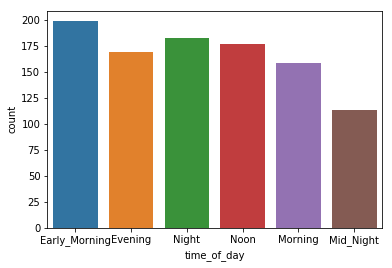

In [104]:
sns.countplot(data_model.time_of_day)

In [105]:
data.shape,test.shape

((1000, 42), (1000, 169))

In [106]:
data['incident_date'] = pd.to_datetime(data['incident_date'])

In [107]:
data['incident_date'].dt.day_name()

0         Sunday
1      Wednesday
2         Sunday
3       Saturday
4        Tuesday
         ...    
995       Sunday
996     Saturday
997       Friday
998     Thursday
999     Thursday
Name: incident_date, Length: 1000, dtype: object

In [108]:
data['incident_dayOfWeek'] = data['incident_date'].dt.day_name()

In [109]:
data['incident_month'] = data['incident_date'].dt.month_name()

In [110]:
data['incident_year'] = data['incident_date'].dt.year

In [111]:
data.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,time_of_day,policy_csl_person,policy_csl_accident,incident_dayOfWeek,incident_month,incident_year
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,Early_Morning,250,500,Sunday,January,2015
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,No_info_colsn_type,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,No_info_prprty_dmg,0,0,No_info_police_report,5070,780,780,3510,Mercedes,E400,2007,Y,Early_Morning,250,500,Wednesday,January,2015
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,Early_Morning,100,300,Sunday,February,2015
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,2015-01-10,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,No_info_prprty_dmg,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,Early_Morning,250,500,Saturday,January,2015
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,2015-02-17,Vehicle Theft,No_info_colsn_type,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,Evening,500,1000,Tuesday,February,2015


In [112]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 45 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_number                1000 non-null   int64         
 3   policy_bind_date             1000 non-null   object        
 4   policy_state                 1000 non-null   object        
 5   policy_csl                   1000 non-null   object        
 6   policy_deductable            1000 non-null   int64         
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   int64         
 9   insured_zip                  1000 non-null   int64         
 10  insured_sex                  1000 non-null   object        
 11  insured_education_level      1000 non-null  

In [113]:
data['incident_year'] = data['incident_year'].astype('str')

In [114]:
data.incident_year.value_counts()

2015    1000
Name: incident_year, dtype: int64

In [115]:
data.incident_month.value_counts()

January     516
February    472
March        12
Name: incident_month, dtype: int64

In [116]:
top_x(test,'incident_dayOfWeek')
top_x(test,'incident_month')
top_x(test,'incident_year')

In [117]:
test.head()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year_1995,auto_year_1999,auto_year_2005,auto_year_2011,auto_year_2006,auto_year_2007,auto_year_2003,auto_year_2009,auto_year_2010,auto_year_2013,auto_year_2002,auto_year_2015,auto_year_1997,auto_year_2012,auto_year_2008,auto_year_2014,auto_year_2000,auto_year_2001,auto_year_1998,auto_year_2004,auto_year_1996,time_of_day_Early_Morning,time_of_day_Night,time_of_day_Noon,time_of_day_Evening,time_of_day_Morning,time_of_day_Mid_Night,policy_state_OH,policy_state_IL,policy_state_IN,policy_csl_person_250,policy_csl_person_100,policy_csl_person_500,policy_csl_accident_500,policy_csl_accident_300,policy_csl_accident_1000,insured_sex_FEMALE,insured_sex_MALE,insured_hobbies_reading,insured_hobbies_exercise,insured_hobbies_paintball,insured_hobbies_bungie-jumping,insured_hobbies_golf,insured_hobbies_movies,insured_hobbies_camping,insured_hobbies_kayaking,insured_hobbies_yachting,insured_hobbies_hiking,insured_hobbies_video-games,insured_hobbies_base-jumping,insured_hobbies_skydiving,insured_hobbies_board-games,insured_hobbies_polo,insured_hobbies_chess,insured_hobbies_dancing,insured_hobbies_sleeping,insured_hobbies_cross-fit,insured_hobbies_basketball,insured_relationship_own-child,insured_relationship_other-relative,insured_relationship_not-in-family,insured_relationship_husband,insured_relationship_wife,insured_relationship_unmarried,incident_type_Multi-vehicle Collision,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,incident_type_Parked Car,collision_type_Rear Collision,collision_type_Side Collision,collision_type_Front Collision,collision_type_No_info_colsn_type,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Major Damage,incident_severity_Trivial Damage,authorities_contacted_Police,authorities_contacted_Fire,authorities_contacted_Other,authorities_contacted_Ambulance,authorities_contacted_None,incident_state_NY,incident_state_SC,incident_state_WV,incident_state_NC,incident_state_VA,incident_state_PA,incident_state_OH,incident_city_Springfield,incident_city_Arlington,incident_city_Columbus,incident_city_Northbend,incident_city_Hillsdale,incident_city_Riverwood,incident_city_Northbrook,property_damage_No_info_prprty_dmg,property_damage_NO,property_damage_YES,police_report_available_NO,police_report_available_No_info_police_report,police_report_available_YES,auto_make_Suburu,auto_make_Saab,auto_make_Dodge,auto_make_Nissan,auto_make_Chevrolet,auto_make_Ford,auto_make_BMW,auto_make_Toyota,auto_make_Audi,auto_make_Accura,auto_make_Volkswagen,auto_make_Jeep,auto_make_Mercedes,auto_make_Honda,auto_model_RAM,auto_model_Wrangler,auto_model_Neon,auto_model_A3,auto_model_MDX,auto_model_Jetta,auto_model_Passat,auto_model_Legacy,auto_model_A5,auto_model_Pathfinder,auto_model_Malibu,auto_model_92x,auto_model_Forrestor,auto_model_Camry,auto_model_95,auto_model_F150,auto_model_E400,auto_model_Grand Cherokee,auto_model_93,auto_model_Tahoe,auto_model_Maxima,auto_model_Escape,auto_model_X5,auto_model_Ultima,auto_model_Silverado,auto_model_Civic,auto_model_Highlander,auto_model_Fusion,auto_model_ML350,auto_model_TL,auto_model_Impreza,auto_model_Corolla,auto_model_CRV,auto_model_3 Series,auto_model_C300,auto_model_X6,auto_model_M5,auto_model_Accord,auto_model_RSX,fraud_reported,incident_dayOfWeek_Saturday,incident_dayOfWeek_Wednesday,incident_dayOfWeek_Thursday,incident_dayOfWeek_Friday,incident_dayOfWeek_Monday,incident_dayOfWeek_Tuesday,incident_dayOfWeek_Sunday,incident_month_January,incident_month_February,incident_month_March,incident_year_2015
0,328,48,1000,1406.91,0,53300,0,1,1,2,71610,6510,13020,52080,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0

In [118]:
test.drop(['incident_year_2015'],axis=1,inplace=True)

In [119]:
test.head()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year_1995,auto_year_1999,auto_year_2005,auto_year_2011,auto_year_2006,auto_year_2007,auto_year_2003,auto_year_2009,auto_year_2010,auto_year_2013,auto_year_2002,auto_year_2015,auto_year_1997,auto_year_2012,auto_year_2008,auto_year_2014,auto_year_2000,auto_year_2001,auto_year_1998,auto_year_2004,auto_year_1996,time_of_day_Early_Morning,time_of_day_Night,time_of_day_Noon,time_of_day_Evening,time_of_day_Morning,time_of_day_Mid_Night,policy_state_OH,policy_state_IL,policy_state_IN,policy_csl_person_250,policy_csl_person_100,policy_csl_person_500,policy_csl_accident_500,policy_csl_accident_300,policy_csl_accident_1000,insured_sex_FEMALE,insured_sex_MALE,insured_hobbies_reading,insured_hobbies_exercise,insured_hobbies_paintball,insured_hobbies_bungie-jumping,insured_hobbies_golf,insured_hobbies_movies,insured_hobbies_camping,insured_hobbies_kayaking,insured_hobbies_yachting,insured_hobbies_hiking,insured_hobbies_video-games,insured_hobbies_base-jumping,insured_hobbies_skydiving,insured_hobbies_board-games,insured_hobbies_polo,insured_hobbies_chess,insured_hobbies_dancing,insured_hobbies_sleeping,insured_hobbies_cross-fit,insured_hobbies_basketball,insured_relationship_own-child,insured_relationship_other-relative,insured_relationship_not-in-family,insured_relationship_husband,insured_relationship_wife,insured_relationship_unmarried,incident_type_Multi-vehicle Collision,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,incident_type_Parked Car,collision_type_Rear Collision,collision_type_Side Collision,collision_type_Front Collision,collision_type_No_info_colsn_type,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Major Damage,incident_severity_Trivial Damage,authorities_contacted_Police,authorities_contacted_Fire,authorities_contacted_Other,authorities_contacted_Ambulance,authorities_contacted_None,incident_state_NY,incident_state_SC,incident_state_WV,incident_state_NC,incident_state_VA,incident_state_PA,incident_state_OH,incident_city_Springfield,incident_city_Arlington,incident_city_Columbus,incident_city_Northbend,incident_city_Hillsdale,incident_city_Riverwood,incident_city_Northbrook,property_damage_No_info_prprty_dmg,property_damage_NO,property_damage_YES,police_report_available_NO,police_report_available_No_info_police_report,police_report_available_YES,auto_make_Suburu,auto_make_Saab,auto_make_Dodge,auto_make_Nissan,auto_make_Chevrolet,auto_make_Ford,auto_make_BMW,auto_make_Toyota,auto_make_Audi,auto_make_Accura,auto_make_Volkswagen,auto_make_Jeep,auto_make_Mercedes,auto_make_Honda,auto_model_RAM,auto_model_Wrangler,auto_model_Neon,auto_model_A3,auto_model_MDX,auto_model_Jetta,auto_model_Passat,auto_model_Legacy,auto_model_A5,auto_model_Pathfinder,auto_model_Malibu,auto_model_92x,auto_model_Forrestor,auto_model_Camry,auto_model_95,auto_model_F150,auto_model_E400,auto_model_Grand Cherokee,auto_model_93,auto_model_Tahoe,auto_model_Maxima,auto_model_Escape,auto_model_X5,auto_model_Ultima,auto_model_Silverado,auto_model_Civic,auto_model_Highlander,auto_model_Fusion,auto_model_ML350,auto_model_TL,auto_model_Impreza,auto_model_Corolla,auto_model_CRV,auto_model_3 Series,auto_model_C300,auto_model_X6,auto_model_M5,auto_model_Accord,auto_model_RSX,fraud_reported,incident_dayOfWeek_Saturday,incident_dayOfWeek_Wednesday,incident_dayOfWeek_Thursday,incident_dayOfWeek_Friday,incident_dayOfWeek_Monday,incident_dayOfWeek_Tuesday,incident_dayOfWeek_Sunday,incident_month_January,incident_month_February,incident_month_March
0,328,48,1000,1406.91,0,53300,0,1,1,2,71610,6510,13020,52080,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,

In [357]:
data.shape,test.shape

((1000, 44), (1000, 179))

In [122]:
data.policy_bind_date = pd.to_datetime(data['policy_bind_date'])

In [127]:
(data.incident_date - data.policy_bind_date)

0      100 days
1     3130 days
2     5282 days
3     8996 days
4      256 days
         ...   
995   8622 days
996    384 days
997   4358 days
998   1196 days
999   6681 days
Length: 1000, dtype: timedelta64[ns]

In [128]:
data['lag_days'] = (data.incident_date - data.policy_bind_date)

In [134]:
data['lag_days'] = data['lag_days'].apply(lambda x: x.days)

In [135]:
data['lag_days']

0       100
1      3130
2      5282
3      8996
4       256
       ... 
995    8622
996     384
997    4358
998    1196
999    6681
Name: lag_days, Length: 1000, dtype: int64

In [136]:
test['lag_days'] = data['lag_days']

In [ ]:
# 'insured_education_level','insured_occupation'

In [166]:
data.insured_education_level.value_counts()

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64

In [167]:
data.insured_occupation.value_counts()

machine-op-inspct    93
prof-specialty       85
tech-support         78
exec-managerial      76
sales                76
craft-repair         74
transport-moving     72
priv-house-serv      71
other-service        71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64

In [168]:
top_x(test,'insured_education_level')
top_x(test,'insured_occupation')

In [169]:
type(test)

pandas.core.frame.DataFrame

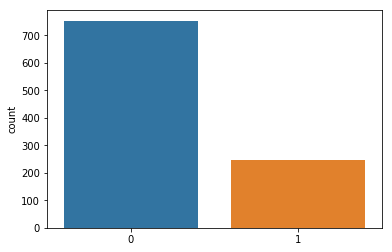

In [362]:
sns.countplot(test.fraud_reported)

In [172]:
X.shape,test.shape

((1000, 200), (1000, 201))

In [171]:
X = test.drop(['fraud_reported'],axis=1)
y = test.fraud_reported

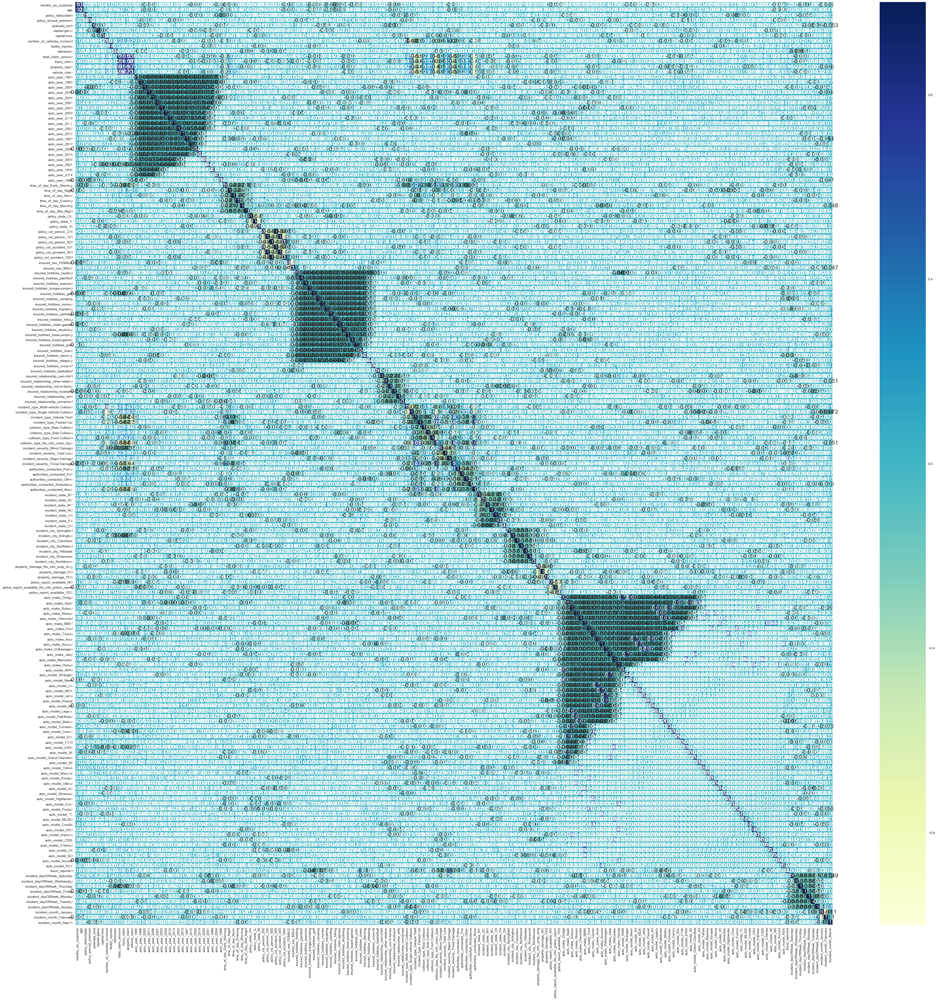

In [509]:
plt.figure(figsize=(50,50))
sns.heatmap(test.corr(),cmap='YlGnBu',annot=True)
plt.show()

In [173]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,stratify = y, random_state=42)

In [174]:
y_train.sum(),y_test.sum()

(198, 49)

In [175]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(random_state=0,class_weight='balanced')
clf.fit(X_train, y_train)

y_test_pred = clf.predict(X_test)

In [176]:
pred_prob1 = clf.predict_proba(X_test)

In [177]:
from sklearn.metrics import f1_score
f1_score(y_test, y_test_pred, average='micro')

0.55

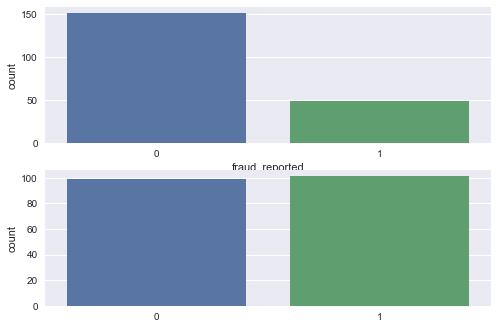

In [178]:
plt.subplot(2,1,1)
sns.countplot(y_test)
plt.subplot(2,1,2)
sns.countplot(y_test_pred)

In [179]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_test_pred)

array([[80, 71],
       [19, 30]], dtype=int64)

In [180]:
pd.set_option('display.max_rows',None)
out = pd.DataFrame(clf.coef_.T,X_train.columns)
out.columns=['coeff']

In [181]:
out.sort_values('coeff',ascending=False)

,coeff
property_claim,2.206415e-05
vehicle_claim,9.952896e-06
total_claim_amount,5.527730e-06
capital-loss,2.311258e-06
incident_severity_Major Damage,7.541006e-07
capital-gains,4.419450e-07
insured_hobbies_chess,2.497079e-07
insured_hobbies_cross-fit,1.729907e-07
incident_state_SC,8.964183e-08
umbrella_limit,7.331772e-08


In [182]:
from sklearn.metrics import roc_curve

# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)

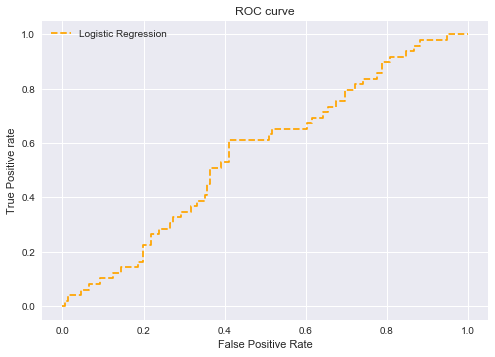

In [183]:
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Logistic Regression')
#plt.plot(fpr2, tpr2, linestyle='--',color='green', label='KNN')
#plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

In [184]:
from xgboost import XGBClassifier
model = XGBClassifier()

model.fit(X_train, y_train)

y_test_pred = model.predict(X_test)

In [185]:
pred_prob1 = model.predict_proba(X_test)
f1_score(y_test, y_test_pred, average='micro')

0.8000000000000002

In [186]:
confusion_matrix(y_test,y_test_pred)

array([[136,  15],
       [ 25,  24]], dtype=int64)

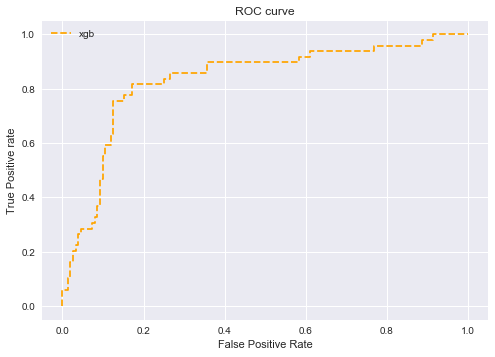

In [187]:
from sklearn.metrics import roc_curve

# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='xgb')
#plt.plot(fpr2, tpr2, linestyle='--',color='green', label='KNN')
#plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

In [188]:
test.fraud_reported.sum(),len(test)

(247, 1000)

In [189]:
y_train.sum(),len(y_train_pred)

(198, 800)

In [190]:
y_test.sum(),len(y_test_pred)

(49, 200)

## source isolation forest

https://lambda.grofers.com/anomaly-detection-using-isolation-forest-80b3a3d1a9d8

https://medium.com/@arpitbhayani/isolation-forest-algorithm-for-anomaly-detection-f88af2d5518d

In [196]:
#Training with isolation forest algorithm
clf = IsolationForest(random_state=0, contamination=0.30)
clf.fit(X_train)

#Now we predict the anomaly state for data
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)  

In [197]:
y_train_pred = np.where(y_train_pred == -1,1,0)
y_test_pred = np.where(y_test_pred == -1,1,0)

In [198]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_train,y_train_pred)

array([[412, 190],
       [148,  50]], dtype=int64)

In [199]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_test_pred)

array([[110,  41],
       [ 30,  19]], dtype=int64)

In [200]:
f1_score(y_test, y_test_pred, average='micro')

0.645

## Further

https://www.analyticsvidhya.com/blog/2021/05/anomaly-detection-using-autoencoders-a-walk-through-in-python/
https://www.analyticsvidhya.com/blog/2021/05/getting-familiar-with-pycaret-for-anomaly-detection/

##### Local Outlier Factor
##### Isolation Forest
##### Connectivity Based Outlier Factor
##### KNN based Outlier Detection
##### One class SVM
##### AutoEncoders